In [6]:
import json
import os
import glob
import re
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import shutil

In [4]:
sv1 = pd.read_csv('/data/NIA50/50-2/kimgh/cng_sv_1.csv')
sv2 = pd.read_csv('/data/NIA50/50-2/kimgh/cng_sv_2.csv')

In [ ]:
for scene in sv1['scene'].unique():
    shutil.copytree(f'/data/NIA50/50-2/final/raw/{scene}', f'/data/NIA50/SUSTechPOINTS_aivill_test/data/{scene}', dirs_exist_ok=True)

for scene in sv2['scene'].unique():
    shutil.copytree(f'/data/NIA50/50-2/final/raw/{scene}', f'/data/NIA50/SUSTechPOINTS_aivill_test_copy/data/{scene}', dirs_exist_ok=True)

In [4]:
dp.head()

,id,class,min_x,min_y,max_x,max_y,point_x,point_y,point_z,l,w,h,rot_y,intrinsic,extrinsic,mov_point_z,scene,frame
0,1,Adult,1346.0,591.0,1377.0,638.0,-11.147488,-25.097581,2.900866,0.353040,0.564717,1.100898,-2.211858,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",14,L_2210_Suwon_A_A_C0001,0000
1,2,Adult,1253.0,576.0,1276.0,618.0,-9.131391,-26.735702,2.962179,0.272937,0.464026,1.079192,-2.010535,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",14,L_2210_Suwon_A_A_C0001,0000
2,3,Adult,1311.0,557.0,1329.0,599.0,-11.174683,-28.213541,3.166166,0.339680,0.304974,1.146743,-2.164436,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",14,L_2210_Suwon_A_A_C0001,0000
3,4,Adult,1152.0,559.0,1167.0,599.0,-6.957083,-30.004578,2.719870,0.308613,0.260686,1.151948,-0.726025,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",14,L_2210_Suwon_A_A_C0001,0000
4,5,Adult,1146.0,577.0,1160.0,616.0,-6.489054,-28.661408,2.477767,0.313840,0.127882,1.118005,-0.496803,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",14,L_2210_Suwon_A_A_C0001,0000


In [3]:
len(dp['scene'].unique())

4886

In [16]:
for type_ in sorted(set([i[:-6] for i in os.listdir('/data/NIA50/50-2/data/nia50_final/raw')])):
    print(type_, len(glob.glob(f'/data/NIA50/50-2/data/nia50_final/raw/{type_}*')))

L_2210_Suwon_A_A 359
L_2210_Suwon_A_F 201
L_2210_Suwon_A_N 400
L_2210_Suwon_B_A 470
L_2210_Suwon_B_F 201
L_2210_Suwon_B_N 400
L_2211_Pangyo_C_A 301
L_2211_Pangyo_C_D 151
L_2211_Pangyo_C_F 500
L_2211_Pangyo_D_A 300
L_2211_Pangyo_D_D 50
L_2211_Pangyo_D_F 479
L_2211_Suwon_A_A 476
L_2211_Suwon_B_A 801
L_2211_Suwon_B_D 151
L_2211_Suwon_B_F 576


In [3]:
import os, glob, re, json

scenes = sorted(glob.glob('/data/NIA50/50-2/data/nia50_final/raw/*'))

scene_names = []
for scene in scenes:
    scene_name = re.findall('[\w]+', scene)[-1]
    # if len(os.listdir(scene)) < 5:
    # if os.path.isdir(f'{scene}/label')==False:
    labels = sorted(os.listdir(f'{scene}/label'))
    for label in labels:
        with open(f'{scene}/label/{label}', 'r') as f:
            data = json.load(f)
            if len(data) == 0:
                print(scene_name, label)
                scene_names.append(scene_name)

L_2210_Suwon_A_A_C0216 0001.json
L_2210_Suwon_A_A_C0233 0000.json
L_2210_Suwon_A_F_C0001 0000.json
L_2210_Suwon_A_F_C0001 0001.json
L_2210_Suwon_A_F_C0001 0002.json
L_2210_Suwon_A_F_C0001 0003.json
L_2210_Suwon_A_F_C0001 0004.json
L_2210_Suwon_A_F_C0001 0005.json
L_2210_Suwon_A_F_C0001 0006.json
L_2210_Suwon_A_F_C0001 0007.json
L_2210_Suwon_A_F_C0001 0008.json
L_2210_Suwon_A_F_C0001 0009.json
L_2210_Suwon_A_F_C0002 0000.json
L_2210_Suwon_A_F_C0002 0001.json
L_2210_Suwon_A_F_C0002 0002.json
L_2210_Suwon_A_F_C0002 0003.json
L_2210_Suwon_A_F_C0002 0004.json
L_2210_Suwon_A_F_C0002 0005.json
L_2210_Suwon_A_F_C0002 0006.json
L_2210_Suwon_A_F_C0002 0007.json
L_2210_Suwon_A_F_C0002 0008.json
L_2210_Suwon_A_F_C0002 0009.json
L_2210_Suwon_A_F_C0003 0000.json
L_2210_Suwon_A_F_C0003 0001.json
L_2210_Suwon_A_F_C0003 0002.json
L_2210_Suwon_A_F_C0003 0003.json
L_2210_Suwon_A_F_C0003 0004.json
L_2210_Suwon_A_F_C0003 0005.json
L_2210_Suwon_A_F_C0003 0006.json
L_2210_Suwon_A_F_C0003 0007.json
L_2210_Suw

In [9]:
from collections import Counter

dict(Counter(scene_names))

{'L_2210_Suwon_A_A_C0216': 1,
 'L_2210_Suwon_A_A_C0233': 1,
 'L_2210_Suwon_A_F_C0001': 10,
 'L_2210_Suwon_A_F_C0002': 10,
 'L_2210_Suwon_A_F_C0003': 10,
 'L_2210_Suwon_A_F_C0004': 10,
 'L_2210_Suwon_A_F_C0005': 10,
 'L_2210_Suwon_A_F_C0006': 10,
 'L_2210_Suwon_A_F_C0007': 10,
 'L_2210_Suwon_A_F_C0008': 10,
 'L_2210_Suwon_A_F_C0009': 10,
 'L_2210_Suwon_A_F_C0010': 10,
 'L_2210_Suwon_A_F_C0011': 10,
 'L_2210_Suwon_A_F_C0012': 10,
 'L_2210_Suwon_A_F_C0013': 10,
 'L_2210_Suwon_A_F_C0014': 10,
 'L_2210_Suwon_A_F_C0015': 10,
 'L_2210_Suwon_A_F_C0016': 10,
 'L_2210_Suwon_A_F_C0017': 10,
 'L_2210_Suwon_A_F_C0018': 10,
 'L_2210_Suwon_A_F_C0019': 10,
 'L_2210_Suwon_A_F_C0020': 10,
 'L_2210_Suwon_A_F_C0021': 10,
 'L_2210_Suwon_A_F_C0022': 10,
 'L_2210_Suwon_A_F_C0023': 10,
 'L_2210_Suwon_A_F_C0024': 10,
 'L_2210_Suwon_A_F_C0025': 10,
 'L_2210_Suwon_A_F_C0026': 10,
 'L_2210_Suwon_A_F_C0027': 10,
 'L_2210_Suwon_A_F_C0028': 10,
 'L_2210_Suwon_A_F_C0029': 10,
 'L_2210_Suwon_A_F_C0030': 10,
 'L_2210_S

In [2]:
%cd /data/NIA50/50-2/models/OpenPCDet_aivill

dataset = '/data/NIA50/50-2/data/nia50_final/pvrcnn_integ_final/nia50_pvrcnn_integ_final_data.yaml'

f'python -m pcdet.datasets.custom.custom_dataset create_custom_infos {dataset}'

/data/NIA50/50-2/models/OpenPCDet_aivill


'python -m pcdet.datasets.custom.custom_dataset create_custom_infos /data/NIA50/50-2/data/nia50_final/pvrcnn_integ_final/nia50_pvrcnn_integ_final_data.yaml'

In [1]:
%cd /data/NIA50/50-2/models/OpenPCDet_aivill/tools

# ckpt = '/data/NIA50/50-2/models/OpenPCD/ckpt/pv_rcnn_8369.pth'
cfg_file = '/data/NIA50/50-2/data/nia50_final/pvrcnn_integ_final/nia50_pvrcnn_integ_final_model.yaml'
project = '/data/NIA50/50-2/result/pvrcnn_integ_final/train'

!CUDA_VISIBLE_DEVICES=0,1 bash scripts/dist_train.sh 2 --cfg_file {cfg_file} --project {project} --batch_size 6

/data/NIA50/50-2/models/OpenPCDet_aivill/tools
+ NGPUS=2
+ PY_ARGS='--cfg_file /data/NIA50/50-2/data/nia50_final/pvrcnn_integ_final/nia50_pvrcnn_integ_final_model.yaml --project /data/NIA50/50-2/result/pvrcnn_integ_final/train --batch_size 6'
+ true
+ PORT=54703
++ nc -z 127.0.0.1 54703
++ echo 1
+ status=1
+ '[' 1 '!=' 0 ']'
+ break
+ echo 54703
54703
+ python -m torch.distributed.launch --nproc_per_node=2 --rdzv_endpoint=localhost:54703 train.py --launcher pytorch --cfg_file /data/NIA50/50-2/data/nia50_final/pvrcnn_integ_final/nia50_pvrcnn_integ_final_model.yaml --project /data/NIA50/50-2/result/pvrcnn_integ_final/train --batch_size 6
/home/ubuntu/anaconda3/envs/spiner310/lib/python3.10/site-packages/torch/distributed/launch.py:180: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.en

In [31]:
src = '/data/NIA50/50-2/data/nia50_final/pvrcnn_integ/points_안 자른 것'
dst = '/data/NIA50/50-2/data/nia50_final/pvrcnn_integ/points'

npys = os.listdir(src)
for npy_name in npys:
    npy = np.load(f'{src}/{npy_name}')
    new_npy = npy[np.where((npy[:, 0]>=-50) & (npy[:, 0]<=50) & (npy[:, 1]<=0) & (npy[:, 1]>=-50) & (npy[:, 2]>=-4) & (npy[:, 2]<=8))]
    np.save(f'{dst}/{npy_name}', new_npy)

In [32]:
len(os.listdir(dst))

48124

points.shape:  (16538, 4)
min_x:  -49.984497 	min_y:  -49.828228 	min_z:  -2.4217377
max_x:  49.966045 	max_y:  -0.0014456221 	max_z:  7.9984283


/tmp/ipykernel_834691/890122539.py:35: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(points[:, 0], points[:, 1], points[:, 2], cmap='viridis', s = 0.1)


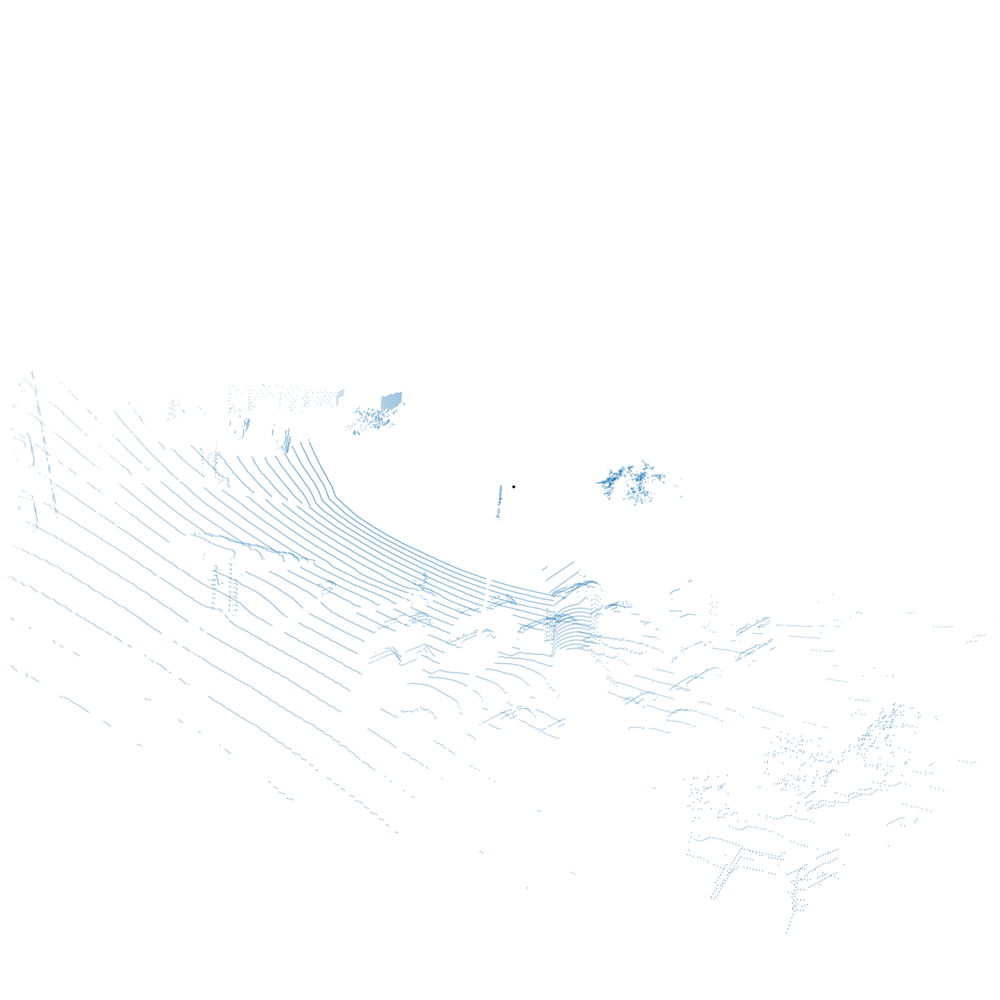

In [29]:
import numpy as np
from glob import glob

points = npy[np.where((npy[:, 0]>=-50) & (npy[:, 0]<=50) & (npy[:, 1]<=0) & (npy[:, 1]>=-50) & (npy[:, 2]>=-4) & (npy[:, 2]<=8))]
# points = np_pcd_file[:, :3]
print("points.shape: ", points.shape)
# crop the points
# crop_x = (xmin, xmax)
# crop_y = (ymin, ymax)
# crop_z = (zmin, zmax)

max_x, max_y, max_z, _ = np.max(points, axis=0)
min_x, min_y, min_z, _ = np.min(points, axis=0)
print("min_x: ", min_x, "\tmin_y: ", min_y, "\tmin_z: ", min_z)
print("max_x: ", max_x, "\tmax_y: ", max_y, "\tmax_z: ", max_z)
# cmax_x, cmax_y, cmax_z = np.max(points_crop, axis=0)
# cmin_x, cmin_y, cmin_z = np.min(points_crop, axis=0)
# print("cmin_x: ", cmin_x, "\tcmin_y: ", cmin_y, "\tcmin_z: ", cmin_z)
# print("cmax_x: ", cmax_x, "\tcmax_y: ", cmax_y, "\tcmax_z: ", cmax_z)
# print("crop x, y, z: ", crop_x, crop_y, crop_z)

points = np.hstack((points, np.ones((len(points), 1))))
# points_crop = np.hstack((points_crop, np.ones((len(points_crop), 1))))

# view bird's eye view

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# hide axes, set background color to white
# x: left to right, y: front to back, z: bottom to top

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points[:, 0], points[:, 1], points[:, 2], cmap='viridis', s = 0.1)
ax.scatter(0, 0, 0, color='black', s=5)

# ax.scatter(points_crop[:, 0]*-1, points_crop[:, 1]*-1, points_crop[:, 2], cmap='viridis', color='yellow', s = 0.1)
zoom = 25
ax.set_xlim(-zoom, zoom)
ax.set_ylim(-zoom, zoom)
ax.set_zlim(-zoom, zoom)
ax.set_facecolor('white')
ax.set_axis_off()
plt.show()


In [17]:
len(os.listdir('/data/NIA50/50-2/data/nia50_final/yolov5_integ/labels'))

48244

In [31]:
scene_type = []

scenes = sorted(os.listdir('/data/NIA50/50-2/data/NIA50/nia50_all/raw'))

for scene in scenes:
    type_ = re.findall('[0-9]+_[a-zA-Z]+_[A-Z]_[A-Z]', scene)[0]
    scene_type.append(type_)


scp -i D:/workspace/AIVIll/gpuserver/aica_427.pem -r "Z:\AI_2-050\00.구축데이터\2.지능형인프라기반센서동적객체인지데이터\전체데이터셋(원천+라벨)\2211\Suwon_B\A\L_2211_Suwon_B_A*" ubuntu@133.186.213.110:/data/NIA50/50-2/data/nia50_final/raw

In [22]:
import pandas as pd

dp = pd.read_csv('/data/NIA50/50-2/data/nia50_final/data_info.csv', index_col=0, dtype={'frame':object})
dp.loc[dp['spe']]

,id,class,min_x,min_y,max_x,max_y,point_x,point_y,point_z,l,w,h,rot_y,intrinsic,extrinsic,scene,frame
483270,1,Car,539.832,606.566,727.124,715.143,7.954111,-25.861956,1.466031,4.762167,1.514009,1.601619,-2.226313,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483271,2,Adult,1110.844,571.377,1152.500,637.301,-5.643598,-27.555133,2.533874,0.438965,0.981337,1.762189,-1.300270,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483272,3,Adult,1050.575,608.104,1079.474,654.909,-3.478189,-25.265803,2.375187,0.472374,0.571612,1.102654,-1.265364,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483273,4,Adult,1321.146,588.447,1344.696,638.959,-10.435628,-25.177337,2.896107,0.290643,0.349020,1.246975,-2.740171,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483274,8,SUV,345.418,571.562,496.698,657.464,17.042704,-32.347468,0.989874,3.999984,1.793390,1.813049,-2.068535,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483275,9,Car,234.535,642.532,309.526,691.744,19.200653,-27.718430,0.565254,1.821075,0.322931,0.924304,-1.988020,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483276,23,Car,2228.918,909.843,1920.000,1200.000,-14.369788,-6.751794,3.472265,4.225990,1.652752,1.347792,2.308836,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483277,24,Adult,2983.591,710.777,1920.000,879.193,-23.210198,-9.887146,4.943270,0.278128,0.398491,1.750848,-0.616850,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001
483278,25,Adult,3050.262,725.172,1920.000,904.700,-22.796463,-9.233917,5.034636,0.525739,0.373967,1.692294,-0.616850,"[1000.376117, 0.0, 940.460494, 0.0, 0.0, 1000....","[-0.999997, 0.000698124, 0.00252111, -0.196528...",L_2211_Suwon_B_A_C0672,0001


In [12]:
import shutil

images = glob.glob('/data/NIA50/50-2/data/nia50_final/yolov5_integ/test_images/*')
dst = '/data/NIA50/50-2/data/nia50_final/yolov5_integ/images'
# dst = '/data/NIA50/kimgh'

for image in images:
    shutil.move(image, dst)
# scenes = sorted(os.listdir('/data/NIA50/50-2/data/NIA50/nia50_all/raw'))

# for scene in scenes:
#     # if os.path.isdir(f'{dst}/{scene}')==False:
#     shutil.copytree(src, dst, dirs_exist_ok=True)

In [3]:
import shutil

src = '/data/NIA50/50-2/data/NIA50/nia50_all/raw'
dst = '/data/NIA50/50-2/data/nia50_final/raw'
# dst = '/data/NIA50/kimgh'

scenes = sorted(os.listdir('/data/NIA50/50-2/data/NIA50/nia50_all/raw'))

for scene in scenes:
    # if os.path.isdir(f'{dst}/{scene}')==False:
    shutil.mv(f'{src}/{scene}/label', f'{dst}/{scene}/label', dirs_exist_ok=True)

In [10]:
src_path = '/data/NIA50/50-2/data/NIA50/nia50_all/raw/'
# save_path = '/data/NIA50/50-2/data/NIA50/nia50_all/pvrcnn_integ/labels/'
# os.makedirs(save_path, exist_ok=True)
labels = sorted(glob.glob(src_path+'*/label/*.json'))

special_vehicle_scenes = []
for label in labels:
    scene = re.findall('[a-zA-Z_0-9_]+', label)[-4]
    frame = re.findall('[0-9]+', label)[-1]

    with open(f'{src_path}/{scene}/calib/camera/camera_0.json', 'r') as f:
        calib = json.load(f)
    
    with open(label, 'r') as f:
        label = json.load(f)
    
    labeling_ls = []
    for i in np.arange(len(label)):
        try:
            # xyz = list(label[i]['psr']['position'].values())

            # if calib['extrinsic'] == calib_typ['typ1']['calib']: xyz[2] += calib_typ['typ1']['mov_zpoint']
            # elif calib['extrinsic'] == calib_typ['typ2']['calib']: xyz[2] += calib_typ['typ2']['mov_zpoint']
            # elif calib['extrinsic'] == calib_typ['typ3']['calib']: xyz[2] += calib_typ['typ3']['mov_zpoint']
            # elif calib['extrinsic'] == calib_typ['typ4']['calib']: xyz[2] += calib_typ['typ4']['mov_zpoint']

            # lwh = list(label[i]['psr']['scale'].values())
            # rotation_y = [label[i]['psr']['rotation']['z']]
            class_ = label[i]['obj_type']
            # rename_class = [class_ls[class_]]
            # label_format = ' '.join(map(str, xyz + lwh + rotation_y + rename_class))
            # label_format = ' '.join(map(str, xyz + lwh + rotation_y + [class_]))
            # labeling_ls.append(label_format)
            if class_ == 'Special_Vehicle':
                special_vehicle_scenes.append(scene)

            # if xyz[0] < -130:
            #     print('x축', scene, frame)

            # if xyz[1] < -90:
            #     print('y축', scene, frame)

            # if xyz[2] > 8:
            #     print('z축', scene, frame)

            # x.append(xyz[0])
            # y.append(xyz[1])
            # z.append(xyz[2])
        except:
            continue

#     with open(save_path+f'/{scene}_{frame}.txt', 'w') as f:
#         f.write('\n'.join(labeling_ls))

# #  객체 포인트 범위 확인
# print(f'x축 범위: {min(x)} ~ {max(x)}')
# print(f'y축 범위: {min(y)} ~ {max(y)}')
# print(f'z축 범위: {min(z)} ~ {max(z)}')

In [14]:
from collections import Counter

In [21]:
len(set(special_vehicle_scenes))

362

In [16]:
sv = Counter(special_vehicle_scenes)

In [26]:
sv.keys()

dict_keys(['L_2210_Suwon_A_A_C0044', 'L_2210_Suwon_A_A_C0048', 'L_2210_Suwon_A_A_C0049', 'L_2210_Suwon_A_A_C0050', 'L_2210_Suwon_A_A_C0051', 'L_2210_Suwon_A_A_C0052', 'L_2210_Suwon_A_A_C0053', 'L_2210_Suwon_A_A_C0054', 'L_2210_Suwon_A_A_C0055', 'L_2210_Suwon_A_A_C0056', 'L_2210_Suwon_A_A_C0057', 'L_2210_Suwon_A_A_C0058', 'L_2210_Suwon_A_A_C0059', 'L_2210_Suwon_A_A_C0060', 'L_2210_Suwon_A_A_C0061', 'L_2210_Suwon_A_A_C0096', 'L_2210_Suwon_A_A_C0097', 'L_2210_Suwon_A_A_C0117', 'L_2210_Suwon_A_A_C0197', 'L_2210_Suwon_A_A_C0253', 'L_2210_Suwon_A_A_C0254', 'L_2210_Suwon_A_A_C0293', 'L_2210_Suwon_A_A_C0294', 'L_2210_Suwon_A_A_C0295', 'L_2210_Suwon_A_A_C0296', 'L_2210_Suwon_A_A_C0297', 'L_2210_Suwon_A_A_C0298', 'L_2210_Suwon_A_A_C0299', 'L_2210_Suwon_A_A_C0300', 'L_2210_Suwon_A_A_C0301', 'L_2210_Suwon_A_A_C0328', 'L_2210_Suwon_A_A_C0329', 'L_2210_Suwon_A_A_C0350', 'L_2210_Suwon_A_N_C0001', 'L_2210_Suwon_A_N_C0069', 'L_2210_Suwon_A_N_C0105', 'L_2210_Suwon_A_N_C0106', 'L_2210_Suwon_A_N_C0107', '

In [20]:
sum(sv.values())

2962

In [6]:
src_path = '/data/NIA50/50-2/data/NIA50/nia50_all/raw/'
point_src_path = '/data/NIA50/50-2/data/NIA50/nia50_all/pvrcnn_allcat/points'
save_path = '/data/NIA50/50-2/data/NIA50/nia50_all/pvrcnn_allcat/ImageSets/'
os.makedirs(save_path, exist_ok=True)

# dat_typs = set([re.search('[A-Z]_[A-Z]', j).group() for j in os.listdir(src_path)])
scenes = sorted(os.listdir(src_path))
dat_typs = set([re.findall('[a-zA-Z]+_[A-Z]_[A-Z]', scene)[0] for scene in scenes])
points = sorted(glob.glob(f'{point_src_path}/*.npy'))

train_ls = []
val_ls = []
test_ls = []
for dat_typ in dat_typs:
    # images_typ = [image for image in images if dat_typ in image]
    scenes_typ = [scene for scene in scenes if dat_typ in scene]
    
    train_val, test = train_test_split(scenes_typ, test_size=0.2, shuffle=False, random_state=44)
    train, val = train_test_split(train_val, test_size=0.2, random_state=44)

    # train_ls += [train]
    # val_ls += val
    # test_ls += test
    for j in train:
        for point in points:
            if j in point:
                point = re.findall('[a-zA-Z0-9_]+', point)[-2]
                train_ls.append(point)

    for j in val:
        for point in points:
            if j in point:
                point = re.findall('[a-zA-Z0-9_]+', point)[-2]
                val_ls.append(point)

    for j in test:
        for point in points:
            if j in point:
                point = re.findall('[a-zA-Z0-9_]+', point)[-2]
                test_ls.append(point)

In [1]:
class_ls = {'Small_Car': 0,
            'Light_Car': 1,
            'Car': 2,
            'Van': 3,
            'SUV': 4,
            'Small_Truck': 5,
            'Medium_Truck': 6,
            'Large_Truck': 7,
            'Mini_Bus': 8,
            'Bus': 9,
            'Special_Vehicle': 10,
            'Two_Wheeler': 11,
            'Kickboard': 12,
            'Adult': 13,
            'Kid': 14}

In [6]:
{value+1: key for key, value in class_ls.items()}
    

{1: 'Small_Car',
 2: 'Light_Car',
 3: 'Car',
 4: 'Van',
 5: 'SUV',
 6: 'Small_Truck',
 7: 'Medium_Truck',
 8: 'Large_Truck',
 9: 'Mini_Bus',
 10: 'Bus',
 11: 'Special_Vehicle',
 12: 'Two_Wheeler',
 13: 'Kickboard',
 14: 'Adult',
 15: 'Kid'}

In [7]:
import os

len(os.listdir('/data/NIA50/50-2/data/NIA50/nia50_all/pvrcnn_integ/points'))

26197

In [ ]:
/data/NIA50/50-2/data/NIA50/nia50_all/raw

In [1]:
import pickle as pkl
with open('/data/NIA50/50-2/result/pvrcnn/val/eval/result.pkl', 'rb') as f:
    val = pkl.load(f)
1
val

[{'name': array(['Special_Vehicle', 'Small_Truck', 'Special_Vehicle', 'Light_Car',
         'Bus', 'Car', 'Light_Car', 'Car', 'Car', 'Light_Car', 'Car',
         'Adult', 'Car', 'Small_Car', 'Car', 'Adult', 'Car', 'Adult',
         'Small_Car', 'Two_Wheeler', 'Car', 'Adult', 'Car', 'Adult',
         'Two_Wheeler', 'Adult', 'Van', 'Mini_Bus', 'Adult', 'Large_Truck',
         'Car', 'Light_Car', 'Two_Wheeler', 'Van', 'Light_Car', 'Car',
         'Large_Truck'], dtype='<U15'),
  'score': array([0.9417382 , 0.92245454, 0.8955628 , 0.8943504 , 0.87799937,
         0.8471915 , 0.843637  , 0.77868253, 0.7572748 , 0.7004805 ,
         0.6638363 , 0.6082295 , 0.49559748, 0.48111883, 0.4808322 ,
         0.44917676, 0.4217212 , 0.3869518 , 0.37365922, 0.33287552,
         0.3294919 , 0.3187515 , 0.31635177, 0.29736677, 0.2938044 ,
         0.28869134, 0.28416634, 0.27025577, 0.2698469 , 0.25248522,
         0.22881682, 0.19429758, 0.18386035, 0.1552334 , 0.13201164,
         0.11139685, 0.108928

In [8]:
overlap_0_7 = np.array([[0.7, 0.5, 0.5, 0.7, 0.5, 0.7], 
                        [0.7, 0.5, 0.5, 0.7, 0.5, 0.7],
                        [0.7, 0.5, 0.5, 0.7, 0.5, 0.7]])
overlap_0_5 = np.array([[0.7, 0.5, 0.5, 0.7, 0.5, 0.5], 
                        [0.5, 0.25, 0.25, 0.5, 0.25, 0.5],
                        [0.5, 0.25, 0.25, 0.5, 0.25, 0.5]])
min_overlaps = np.stack([overlap_0_7, overlap_0_5], axis=0)  # [2, 3, 5]

In [22]:
CLASS_NAMES = ['Small_Car', 'Light_Car', 'Car', 'Van', 'SUV', 'Small_Truck', 'Bus', 'Two_Wheeler', 'Kickboard', 'Adult', 'Kid']
CLASS_NAMES[0]

'Small_Car'

In [21]:
min_overlaps[:, :, 0]

array([[0.7, 0.7, 0.7],
       [0.7, 0.5, 0.5]])

In [9]:
min_overlaps

array([[[0.7 , 0.5 , 0.5 , 0.7 , 0.5 , 0.7 ],
        [0.7 , 0.5 , 0.5 , 0.7 , 0.5 , 0.7 ],
        [0.7 , 0.5 , 0.5 , 0.7 , 0.5 , 0.7 ]],

       [[0.7 , 0.5 , 0.5 , 0.7 , 0.5 , 0.5 ],
        [0.5 , 0.25, 0.25, 0.5 , 0.25, 0.5 ],
        [0.5 , 0.25, 0.25, 0.5 , 0.25, 0.5 ]]])

In [7]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/nia50_all/pvrcnn/points'))

33400

In [3]:
len(os.listdir('/data/NIA50/NIA50/50-2/data/nia50_all/pvrcnn/points'))

33400

In [3]:
import pickle as pkl
with open('/data/NIA50/NIA50/50-2/result/pvrcnn/test/eval/result.pkl', 'rb') as f:
    test = pkl.load(f)

test

[{'name': array(['Car', 'Car', 'Car', 'SUV', 'Car', 'Van', 'Two_Wheeler', 'Car',
         'Van', 'Two_Wheeler', 'Adult', 'Adult', 'Adult', 'Adult', 'Adult',
         'Adult', 'SUV', 'Car', 'Car', 'Adult', 'Adult', 'Adult',
         'Two_Wheeler', 'Two_Wheeler', 'Adult', 'Van', 'Kid', 'Two_Wheeler',
         'Two_Wheeler', 'Two_Wheeler'], dtype='<U11'),
  'score': array([0.9624746 , 0.9461128 , 0.9021191 , 0.84315056, 0.7396459 ,
         0.70905536, 0.6652936 , 0.6613387 , 0.64122313, 0.5690607 ,
         0.46190447, 0.45621437, 0.4513763 , 0.43677282, 0.41853064,
         0.37766606, 0.37125108, 0.3361362 , 0.33427408, 0.33268812,
         0.33063155, 0.25710493, 0.24603671, 0.2264785 , 0.22581758,
         0.22306165, 0.20283213, 0.1347695 , 0.11995964, 0.10817242],
        dtype=float32),
  'boxes_lidar': array([[ 1.04739408e+01, -1.61346626e+01,  1.02521229e+00,
           4.77569485e+00,  1.67832017e+00,  1.50466311e+00,
           4.14340591e+00],
         [ 1.42051306e+01, -1.70

In [2]:
import pandas as pd

In [3]:
a = pd.read_csv('/data/NIA50/kimgh/aaa.csv', sep='\t', index_col=0)
a = a + 0.2
a = a.apply(lambda x: round(x, 2))
a.to_csv('/data/NIA50/kimgh/bbb.csv', sep=',')

In [11]:
%cd /NIA50/50-2/models/DeepFusionMOT

data_root = '/NIA50/kimgh/deepfusionmot'
detections_3D = '3D_pvrcnn'
detections_2D = '2D_yolov5'
save_root = '/NIA50/kimgh/deepfusionmot/result'

!python main.py --data-root {data_root} --detections3D {detections_3D} --detections2D {detections_2D} --save-root {save_root} --save-img

/NIA50/50-2/models/DeepFusionMOT
--------------Start processing the L_2210_Suwon_A_A_C0040 dataset--------------
/NIA50/50-2/models/DeepFusionMOT/tracking/cost_function.py:32: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, A), array(float64, 1d, C))
  return 0.5 * np.abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1)))
--------------The time it takes to process all datasets are 1.0951330661773682s --------------
--------------FPS = 9.131310439657929 --------------


In [12]:
%cd /NIA50/50-2/models/TrackEval

# USE_PARALLEL = True
# NUM_PARALLEL_CORES = 4
# # CLASSES_TO_EVAL = ['Car', 'Pedestrian', 'Cyclist']
GT_FOLDER = '/NIA50/kimgh/trackeval/gt'
TRACKERS_FOLDER = '/NIA50/kimgh/trackeval/trackers'
# TRACKER_SUB_FOLDER = 'trackers'
OUTPUT_FOLDER = '/NIA50/kimgh/trackeval/result'

!python scripts/run_kitti.py --GT_FOLDER {GT_FOLDER} --TRACKERS_FOLDER {TRACKERS_FOLDER} --OUTPUT_FOLDER {OUTPUT_FOLDER}

/NIA50/50-2/models/TrackEval

Eval Config:
USE_PARALLEL         : False                         
NUM_PARALLEL_CORES   : 8                             
BREAK_ON_ERROR       : True                          
RETURN_ON_ERROR      : False                         
LOG_ON_ERROR         : /NIA50/50-2/models/TrackEval/error_log.txt
PRINT_RESULTS        : True                          
PRINT_ONLY_COMBINED  : False                         
PRINT_CONFIG         : True                          
TIME_PROGRESS        : True                          
DISPLAY_LESS_PROGRESS : False                         
OUTPUT_SUMMARY       : True                          
OUTPUT_EMPTY_CLASSES : True                          
OUTPUT_DETAILED      : True                          
PLOT_CURVES          : True                          

Kitti2DBox Config:
PRINT_CONFIG         : True                          
GT_FOLDER            : /NIA50/kimgh/trackeval/gt     
TRACKERS_FOLDER      : /NIA50/kimgh/trackeval/trackers
OUTPU

In [6]:
%cd /NIA50/50-2/models/yolov5

data = '/NIA50/50-2/data/nia50_all/yolov5/nia50_yolo5l6_data.yaml'
# model = 'data/nia50_model_yolov5l6.yaml'
weights = '/NIA50/50-2/result/yolov5/train/nia50_all3/weights/best.pt'
img_size = '1200 1920'
name = '/NIA50/50-2/result/yolov5/test'
source = '/NIA50/50-2/data/nia50_all/yolov5/test_images'

!python detect.py --source {source} --weights {weights} --img {img_size} --conf 0.4 --name {name} \
        --save-txt --save-conf --exist-ok

/NIA50/50-2/models/yolov5
detect: weights=['/NIA50/50-2/result/yolov5/train/nia50_all3/weights/best.pt'], source=/NIA50/50-2/data/nia50_all/yolov5/test_images, data=data/coco128.yaml, imgsz=[1200, 1920], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=/NIA50/50-2/result/yolov5/test, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-82-g1c7fad37 Python-3.10.8 torch-1.12.1+cu113 CUDA:0 (NVIDIA A10, 22580MiB)

Fusing layers... 
nia50_YOLOv5l6_model summary: 267 layers, 46183668 parameters, 0 gradients, 107.9 GFLOPs
WARNING ⚠️ --img-size [1200, 1920] must be multiple of max stride 32, updating to [1216, 1920]
image 1/6710 /NIA50/50-2/data/nia50_all/yolov5/test_images/L_2210_Suwon_A_A_C0004_0000.jpg: 1216x1920 4 Cars, 3 SUVs, 1 Bus, 4 

In [19]:
scenes = glob.glob('/NIA50/50-2/data/nia50_all/raw/*/2d_label')

for scene in sorted(scenes):
    if len(os.listdir(scene))==0:
        print(scene)

/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_F_C0032/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0157/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0158/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0159/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0163/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0164/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0165/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0170/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0171/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0172/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0173/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0174/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0175/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0176/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0177/2d_label
/NIA50/50-2/data/nia50_all/raw/L_2210_Suwon_B_N_C0178/2

In [5]:
len(os.listdir('/NIA50/50-2/result/deepfusionmot/data'))

157

In [2]:
with open('/NIA50/50-2/data/nia50_all/pvrcnn/ImageSets/val.txt') as f:
    test = f.readlines()

len(test)

6710

In [9]:
len(os.listdir('/NIA50/50-2/data/nia50_all/deepfusionmot/2D_yolov5'))

671

In [2]:
import pickle as pkl

with open('/NIA50/kimgh/kitti_infos_test.pkl', 'rb') as f:
    val = pkl.load(f)
val

[{'point_cloud': {'num_features': 4, 'lidar_idx': '000000'},
  'image': {'image_idx': '000000',
   'image_shape': array([ 375, 1242], dtype=int32)},
  'calib': {'P2': array([[7.21537720e+02, 0.00000000e+00, 6.09559326e+02, 4.48572807e+01],
          [0.00000000e+00, 7.21537720e+02, 1.72854004e+02, 2.16379106e-01],
          [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 2.74588400e-03],
          [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
   'R0_rect': array([[ 0.9999239 ,  0.00983776, -0.00744505,  0.        ],
          [-0.0098698 ,  0.9999421 , -0.00427846,  0.        ],
          [ 0.00740253,  0.00435161,  0.9999631 ,  0.        ],
          [ 0.        ,  0.        ,  0.        ,  1.        ]],
         dtype=float32),
   'Tr_velo_to_cam': array([[ 7.53374491e-03, -9.99971390e-01, -6.16602018e-04,
           -4.06976603e-03],
          [ 1.48024904e-02,  7.28073297e-04, -9.99890208e-01,
           -7.63161778e-02],
          [ 9.99862075e-01,  7.523790

In [4]:
with open('/NIA50/50-2/data/nia50_all/pvrcnn/custom_infos_val.pkl', 'rb') as f:
    test = pkl.load(f)

test

[{'point_cloud': {'num_features': 4,
   'lidar_idx': 'L_2210_Suwon_A_A_C0009_0000'},
  'annos': {'name': array(['Adult', 'Adult', 'Adult', 'Kid', 'Adult', 'Adult', 'Adult',
          'Adult', 'Adult', 'Adult', 'Adult', 'Car', 'Car', 'Car', 'Car',
          'Car', 'Car', 'SUV', 'Car', 'Car', 'Car', 'SUV', 'Car', 'Car',
          'Car', 'Adult'], dtype='<U5'),
   'gt_boxes_lidar': array([[-18.406054  , -35.755802  ,   3.3194733 ,   0.49592948,
             0.75869924,   0.81564116,  -2.41062   ],
          [-18.405586  , -34.11365   ,   3.656994  ,   0.19725461,
             0.49990174,   0.75629044,  -2.4161644 ],
          [-19.506355  , -32.458073  ,   3.6669803 ,   0.18548734,
             0.5095067 ,   1.3770838 ,  -2.4157805 ],
          [-19.802948  , -32.03718   ,   3.4353259 ,   0.15156499,
             0.23810925,   0.71048737,  -2.3814807 ],
          [-21.242146  , -31.907074  ,   3.852214  ,   0.21845974,
             0.44067383,   1.3909712 ,  -2.4157808 ],
          [-22.7

In [22]:
project = '/NIA50/50-2/result/pvrcnn/train'

from pathlib import Path

Path(project) / output

NameError: name 'output' is not defined

In [36]:
scenes = sorted([re.findall('[a-zA-Z0-9_]+', j)[-1] for j in glob.glob('/NIA50/50-2/data/전체데이터/*/*/*/*')])[1:]
scenes

['L_2210_Suwon_A_A_C0001',
 'L_2210_Suwon_A_A_C0002',
 'L_2210_Suwon_A_A_C0003',
 'L_2210_Suwon_A_A_C0004',
 'L_2210_Suwon_A_A_C0005',
 'L_2210_Suwon_A_A_C0006',
 'L_2210_Suwon_A_A_C0007',
 'L_2210_Suwon_A_A_C0008',
 'L_2210_Suwon_A_A_C0009',
 'L_2210_Suwon_A_A_C0010',
 'L_2210_Suwon_A_A_C0011',
 'L_2210_Suwon_A_A_C0012',
 'L_2210_Suwon_A_A_C0013',
 'L_2210_Suwon_A_A_C0014',
 'L_2210_Suwon_A_A_C0015',
 'L_2210_Suwon_A_A_C0016',
 'L_2210_Suwon_A_A_C0017',
 'L_2210_Suwon_A_A_C0018',
 'L_2210_Suwon_A_A_C0019',
 'L_2210_Suwon_A_A_C0020',
 'L_2210_Suwon_A_A_C0021',
 'L_2210_Suwon_A_A_C0022',
 'L_2210_Suwon_A_A_C0023',
 'L_2210_Suwon_A_A_C0024',
 'L_2210_Suwon_A_A_C0025',
 'L_2210_Suwon_A_A_C0026',
 'L_2210_Suwon_A_A_C0027',
 'L_2210_Suwon_A_A_C0028',
 'L_2210_Suwon_A_A_C0029',
 'L_2210_Suwon_A_A_C0030',
 'L_2210_Suwon_A_A_C0031',
 'L_2210_Suwon_A_A_C0032',
 'L_2210_Suwon_A_A_C0033',
 'L_2210_Suwon_A_A_C0034',
 'L_2210_Suwon_A_A_C0035',
 'L_2210_Suwon_A_A_C0036',
 'L_2210_Suwon_A_A_C0037',
 

In [18]:
import shutil

for scene in scenes:
    src = glob.glob(f'/NIA50/50-2/data/라벨데이터/*/*/*/{scene}/label')
    dst = glob.glob(f'/NIA50/50-2/data/전체데이터/*/*/*/{scene}')

    if os.path.exists(dst+'/label')==False:
        shutil.move(src, dst)

In [44]:
glob.glob('/NIA50/50-2/data/라벨데이터/*/*/*/L_2210_Suwon_A_A_C0001')

['/NIA50/50-2/data/라벨데이터/2210/Suwon_A/A/L_2210_Suwon_A_A_C0001']

In [ ]:
!pip install -r /NIA50/kimgh/requirements.txt

In [ ]:
import os
import re 

images = sorted(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/labels'))

imagesets = [re.sub('.txt', '', i) for i in images]

with open('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/ImageSets/test.txt', 'w') as f:
    f.write('\n'.join(imagesets))

In [ ]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/jsons'))

In [ ]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/labels'))

In [ ]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/points'))

In [ ]:
import pickle as pkl

with open('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/custom_infos_val.pkl', 'rb') as f:
    print(len(pkl.load(f)))

In [ ]:
import json

with open('/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/Suwon_A_2210261926_0313/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open('/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/Suwon_A_2210261926_0313/label/0000.json', 'r') as f:
    label = json.load(f)

In [ ]:
def tmp_roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)

In [ ]:
R_tmp = roty(label[label_num]['psr']['rotation']['z'])
R_tmp

In [ ]:
Rxyz = np.matmul(R_tmp, np.asarray(list(xyz.values())))
Rxyz

In [ ]:
np.asarray(list(xyz.values()))

In [ ]:
x, y, z

In [ ]:
x_corners

In [ ]:
corners_3d

In [ ]:
corners_3d

In [ ]:
corners_3d

In [ ]:
corners_3d

In [ ]:
t = 0
Rx = 90
Ry = 90
Rz = 90
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = Rz / 180*np.pi

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, Y, X)
    # return Z * Y * X

roty(t)

In [ ]:
t = 0
Rx = 90
Ry = 90
Rz = 90
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = Rz / 180*np.pi

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, np.matmul(Y, X))
    # return Z * Y * X

roty(t)

In [ ]:
t = 0
Rx = 90
Ry = 90
Rz = 90
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = Rz / 180*np.pi

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    # return np.matmul(Z, Y, X)
    return Z @ Y @ X

roty(t)

(161.0, 751.0, 494.0, 950.0)

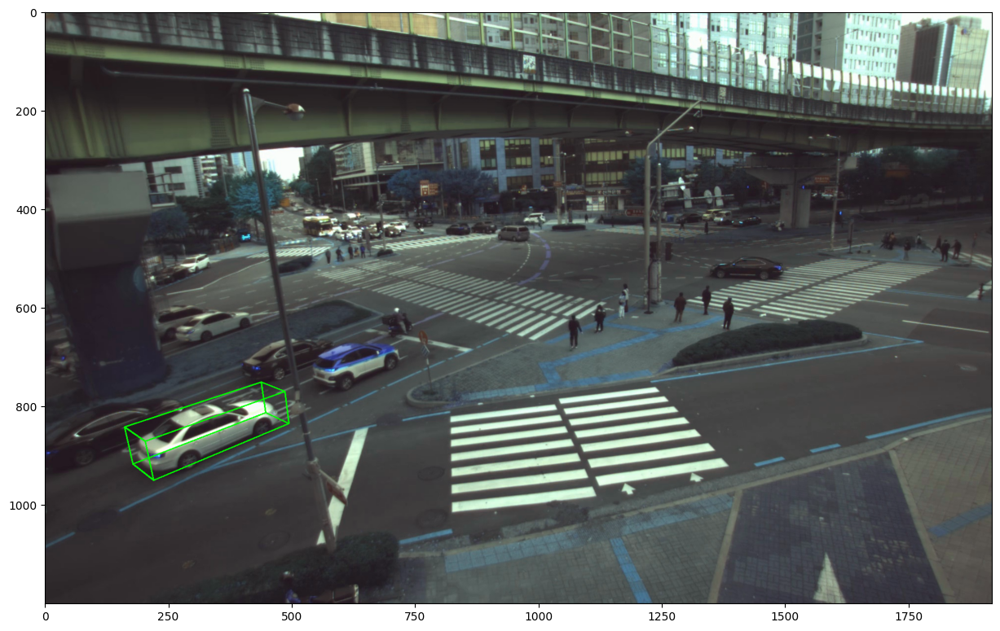

In [103]:
import json

scene = 'L_2210_Suwon_A_A_C0001'
label_num = 10

with open(f'/NIA50/50-2/SUSTechPOINTS/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/NIA50/50-2/SUSTechPOINTS/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/NIA50/50-2/SUSTechPOINTS/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    # X = np.array([[1, 0, 0],
    #                 [0, np.cos(Rx), -np.sin(Rx)],
    #                 [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    # return np.matmul(Z, X)
    return Z
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

# xyz = np.asarray(list(xyz.values()))


x = xyz['x']
y = xyz['y']
z = xyz['z'] + 10
# x = Rxyz[0]
# y = Rxyz[1]
# z = Rxyz[2]
l = lwh['x']
h = lwh['y']
w = lwh['z']

x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
extr[:3, 3] -= (extr[:3, 2] * 10)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])
# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, np.matmul(extr, corners_3d))

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [37]:
corners_3d

array([[  9.78068404,   9.78068404,  12.42438714,  12.42438714,
          8.43025127,   8.43025127,  11.07395438,  11.07395438],
       [-18.50963824, -18.50963824, -14.68000505, -14.68000505,
        -17.57739666, -17.57739666, -13.74776347, -13.74776347],
       [ -2.22007103,  -3.58424916,  -3.58424916,  -2.22007103,
         -2.22007103,  -3.58424916,  -3.58424916,  -2.22007103],
       [  1.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ]])

In [77]:
corners_tmp = corners_3d[:, :3].copy()
corners_tmp[2, :] += 10
corners_tmp

array([[  9.78068404,   9.78068404,  12.42438714],
       [-18.50963824, -18.50963824, -14.68000505],
       [ -2.22007103,  -3.58424916,  -3.58424916],
       [  1.        ,   1.        ,   1.        ]])

In [100]:
extr_tmp = extr.copy()
extr_tmp[:3, 3] = extr_tmp[:3, 3] - (extr_tmp[:3, 2] * 10)
print(extr_tmp)

[[-9.999970e-01  6.981240e-04  2.521110e-03 -1.864442e-01]
 [-2.249580e-03  2.623970e-01 -9.649570e-01  5.333800e+00]
 [-1.335190e-03 -9.649600e-01 -2.623940e-01  1.482230e+00]
 [ 0.000000e+00  0.000000e+00  0.000000e+00  1.000000e+00]]


In [101]:
extr @ corners_3d[:, :3]

array([[ -9.98561796,  -9.9890572 , -12.63007882],
       [  2.5971971 ,   3.91357034,   4.91250738],
       [ 19.91276476,  20.27071692,  16.57174423],
       [  1.        ,   1.        ,   1.        ]])

In [102]:
extr_tmp @ corners_tmp

array([[ -9.98561796,  -9.9890572 , -12.63007882],
       [  2.5971971 ,   3.91357034,   4.91250738],
       [ 19.91276476,  20.27071692,  16.57174423],
       [  1.        ,   1.        ,   1.        ]])

In [99]:
(z + 10) * (extr[0, 2])

0.06584998356060295

In [88]:
z * extr[0,2]

-0.032527764840066996

In [90]:
10 * extr[0,2] - 10 * extr[0,2]

0.0

In [79]:
z * extr[2, 3]

14.730525203403616

In [20]:
z * extr[2, 3] + 10 * extr[2, 3] - 10 * extr[2, 3]

3.3134252034036162

In [22]:
z * extr[2, 3]

-29.820826830632537

In [17]:
# Z축 이동을 위해서 calib와 매칭하여 이동범위 지정

calibs = sorted(glob.glob('/NIA50/50-2/data/nia50_all/raw/*/calib/camera/camera_0.json'))

calib_ls = []
scenes = []
for calib in calibs:
    scene = re.findall('[a-zA-Z0-9_]+', calib)[-5]
    with open(calib, 'r') as f:
        calib = json.load(f)
    if calib['extrinsic'] not in calib_ls:
        calib_ls.append(calib['extrinsic'])
        scenes.append(scene)
    
calib_typ = {'typ1': {'calib': calib_ls[0], 'mov_zpoint': 14},
             'typ2': {'calib': calib_ls[1], 'mov_zpoint': 13},
             'typ3': {'calib': calib_ls[2], 'mov_zpoint': 0},
             'typ4': {'calib': calib_ls[3], 'mov_zpoint': -20}}

In [19]:
calib_typ

{'typ1': {'calib': [-0.999997,
   0.000698124,
   0.00252111,
   -0.1612331,
   -0.00224958,
   0.262397,
   -0.964957,
   -4.31577,
   -0.00133519,
   -0.96496,
   -0.262394,
   -1.14171,
   0,
   0,
   0,
   1],
  'mov_zpoint': 14},
 'typ2': {'calib': [-0.999971,
   -0.00660817,
   -0.00390038,
   0.5771051,
   0.000308449,
   0.473273,
   -0.880916,
   -4.23626,
   0.00766718,
   -0.880891,
   -0.473257,
   -2.07651,
   0,
   0,
   0,
   1],
  'mov_zpoint': 13},
 'typ3': {'calib': [-0.998428,
   -0.0523756,
   -0.0199377,
   0.0890227,
   0.00679634,
   0.239978,
   -0.970755,
   4.82294,
   0.0556285,
   -0.969364,
   -0.239245,
   1.23326,
   0,
   0,
   0,
   1],
  'mov_zpoint': 0},
 'typ4': {'calib': [-0.999825,
   -0.0169222,
   -0.00797488,
   0.19392,
   0.00329349,
   0.260414,
   -0.965491,
   23.5698,
   0.018415,
   -0.965349,
   -0.260313,
   6.3116,
   0,
   0,
   0,
   1],
  'mov_zpoint': -20}}

In [18]:
calib

{'extrinsic': [-0.999997,
  0.000698124,
  0.00252111,
  -0.1612331,
  -0.00224958,
  0.262397,
  -0.964957,
  -4.31577,
  -0.00133519,
  -0.96496,
  -0.262394,
  -1.14171,
  0,
  0,
  0,
  1],
 'intrinsic': [1000.376117,
  0,
  940.460494,
  0,
  1000.726956,
  620.717418,
  0,
  0,
  1]}

(-26.0, 742.0, 335.0, 940.0)

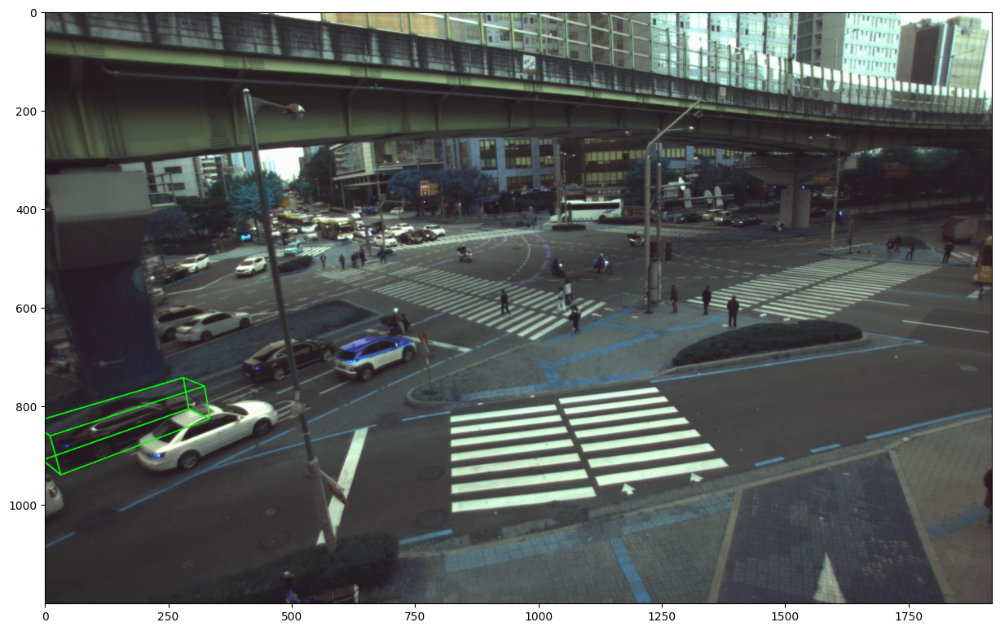

In [22]:
import json

scene = 'L_2210_Suwon_A_A_C0004'
label_num = 1

with open(f'/NIA50/50-2/data/nia50_all/raw/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/NIA50/50-2/data/nia50_all/raw/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/NIA50/50-2/data/nia50_all/raw/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)
    # return Z
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

# xyz = np.asarray(list(xyz.values()))


x = xyz['x']
y = xyz['y']
z = xyz['z']
# # x = Rxyz[0]
# # y = Rxyz[1]
# # z = Rxyz[2]
l = lwh['x']
w = lwh['y']
h = lwh['z']
# x = 6.6894274
# y = -22.088873
# z = -12.605721

x = 1.42051306e+01
y = -1.70362644e+01
z = 8.18589866e-01 - 14
l =  4.86415052e+00
w = 1.71450448e+00
h = 1.45131946e+00
R = roty(4.14990473e+00)

# x = 10.293464
# y = -16.148974
# z = -13.023260
# l = 4.434395
# w = 1.847344
# h = 1.474726
# R = roty(-2.151517)

# x = 18.151434
# y = -30.606922
# z = -13.159989
# l = 4.060978
# w = 1.7086368
# h = 1.3965247
# R = roty(4.2575893)

# x = -4.856326	
# y = -26.015396	
# z = -11.578309	
# l = 0.441090
# w = 0.477765
# h = 1.421249	
# R = roty(5.193722)

x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])
# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, np.matmul(extr, corners_3d))

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [14]:
xyz

{'x': 24.234597577915828, 'y': -25.0657925549244, 'z': -13.74504804611206}

In [15]:
lwh

{'x': 0.7451337339200492, 'y': 1.2451025507401425, 'z': 1.4497156143188477}

In [ ]:
extr.T[:4, :3]

In [ ]:
np.dot(corners_3d.T, extr.T[:4, :3])

In [ ]:
np.dot(corners_3d.T, extr.T)

In [ ]:
intr.T.shape()

In [ ]:
pts_2d = np.matmul(np.matmul(corners_3d.T, extr.T), intr.T)

In [ ]:
pts_2d[:, 0] /= pts_2d[:, 2]
pts_2d[:, 1] /= pts_2d[:, 2]
pts_2d[:,0:2]

In [ ]:
pts_2d[:, 0] /= pts_2d[:, 2]
pts_2d[:, 1] /= pts_2d[:, 2]
pts_2d[:,0:2]

In [ ]:
R

In [ ]:
from scipy.spatial.transform import Rotation



In [ ]:
Rotation.from_matrix(R).as_euler('zyx', degrees=True)

In [ ]:
Rotation.from_euler()

In [ ]:
Rotation.from_matrix(R).as_euler('y', degrees=True)

In [ ]:
import pickle as pkl

with open('/data/NIA50/50-2/data/NIA50/train_1st/pointrcnn/kitti_infos_train.pkl', 'rb') as f:
    train = pkl.load(f)

train[0]

In [ ]:
train[0]['gt_boxes']

In [ ]:
import pickle as pkl

with open('/data/NIA50/50-2/data/NIA50/train_1st/test/kitti_infos_train.pkl', 'rb') as f:
    train = pkl.load(f)

train[0]

In [ ]:
import os

sorted(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/jsons'))

In [ ]:
import json

scene = 'Pangyo_D_2212061041_0009'
label_num = 5

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


# def roty(t, Rx=90/180*np.pi):
#     ''' Rotation about the y-axis. '''
#     t = t + 5/180*np.pi
#     c = np.cos(t)
#     s = np.sin(t)
#     return  np.array([[c, 0, s],
#                     [0, 1, 0],
#                     [-s, 0, c]])

#     # X = np.array([[1, 0, 0],
#     #                 [0, np.cos(Rx), -np.sin(Rx)],
#     #                 [0, np.sin(Rx), np.cos(Rx)]])

#     # # X = np.eye(3)

#     # Z = np.array([[c, -s, 0],
#     #                 [s, c, 0],
#     #                 [0, 0, 1]])
    
#     return np.matmul(Z, X)

#     # return np.eye(3)

Rx = -75
Ry = 75
Rz = 18.5
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = t + (Rz / 180*np.pi)

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    return Z @ Y @ X
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
w = lwh['y']
h = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [1]).T)[:3]
# lwh_ref = R.T @ (extr @ np.hstack((R @ np.asarray(list(lwh.values())).T, [0])).T)[:3].T

# x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
# z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# # corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
# corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
# # corners_3d = np.vstack([corners_3d, [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]])
# corners_3d = R.T @ (extr @ corners_3d)[:3]
# lwh_ref = np.abs(corners_3d).sum(axis=1)/4
# x = xyz['x']
# y = xyz['y']
# z = xyz['z']
# l = lwh['x']
# w = lwh['y']
# h = lwh['z']

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]
l = lwh_ref[0]
w = lwh_ref[1]
h = lwh_ref[2]

x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
# corners_3d = np.vstack([corners_3d, [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]])
# corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

(834.0, 593.0, 1032.0, 858.0)

In [ ]:
import json

scene = 'Pangyo_D_2212061041_0009'
label_num = 0

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    t = t + 90/180*np.pi
    c = np.cos(t)
    s = np.sin(t)
    return  np.array([[c, 0, s],
                    [0, 1, 0],
                    [-s, 0, c]])

    # X = np.array([[1, 0, 0],
    #                 [0, np.cos(Rx), -np.sin(Rx)],
    #                 [0, np.sin(Rx), np.cos(Rx)]])

    # # X = np.eye(3)

    # Z = np.array([[c, -s, 0],
    #                 [s, c, 0],
    #                 [0, 0, 1]])
    
    # return np.matmul(Z, X)
                    

xyz = label[label_num]['psr']['position']
# R = roty(label[label_num]['psr']['rotation']['z'])
R = roty(label[label_num]['psr']['rotation']['z']*-1 - np.pi/2)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
h = lwh['y']
w = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [1]).T)[:3]

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]


x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
# corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [ ]:
label[label_num]['psr']['rotation']['z']*-1 - np.pi/2

In [ ]:
xyz

In [ ]:
np.hstack([xyz_ref, [1]])

In [ ]:
extr.T

In [ ]:
inverse_rigid_trans(extr) @ np.hstack([xyz_ref, [1]]).T

In [ ]:
def inverse_rigid_trans(Tr):
    ''' Inverse a rigid body transform matrix (3x4 as [R|t])
        [R'|-R't; 0|1]
    '''
    inv_Tr = np.zeros_like(Tr) # 3x4
    inv_Tr[0:3, 0:3] = np.transpose(Tr[0:3, 0:3])
    inv_Tr[0:3, 3] = np.dot(-np.transpose(Tr[0:3, 0:3]), Tr[0:3, 3])
    return inv_Tr

inverse_rigid_trans(extr)

In [ ]:
def project_lidar_to_rect(self, pts_3d_lidar):
    pts_3d_ref = self.project_lidar_to_ref(pts_3d_lidar)
    return self.project_ref_to_rect(pts_3d_ref)

def project_lidar_to_ref(self, pts_3d_lidar):
    pts_3d_lidar = self.cart2hom(pts_3d_lidar)  # nx4
    return np.dot(pts_3d_lidar, np.transpose(self.Tr_lidar_to_cam))

def project_ref_to_rect(self, pts_3d_ref):
    '''
    Input and Output are nx3 points
    '''
    # pts_3d_ref = Tr_lidar_to_cam * [x y z 1]
    return np.transpose(np.dot(self.R0_rect, np.transpose(pts_3d_ref)))  # R0_rect_rect * Tr_lidar_to_cam * A

In [ ]:
import os

def img2label_paths(img_paths):
    # Define label paths as a function of image paths
    # sa, sb = f'{os.sep}images{os.sep}', f'{os.sep}labels{os.sep}'  # /images/, /labels/ substrings #origin
    sa, sb = f'{os.sep}images{os.sep}', f'{os.sep}labels_yolo{os.sep}'  # /images/, /labels/ substrings
    
    return [sb.join(x.rsplit(sa, 1)).rsplit('.', 1)[0] + '.txt' for x in img_paths]

In [ ]:
img_paths = os.listdir('/data/NIA50/50-2/data/NIA48/temp_data/images/')

In [ ]:
import open3d as o3d
import cv2
import numpy as np

In [ ]:
# device = o3d.core.Device('cuda:1')
pcd_f = o3d.t.io.read_point_cloud('/data/NIA50/SUSTechPOINTS_2-050/data/example/lidar/000965.pcd')
print(pcd_f)

positions = pcd_f.point.positions.numpy()
intensity = pcd_f.point.intensity.numpy()
pcd = np.concatenate((positions, intensity), axis = 1)

xyzi = np.stack([pcd[:,1]*-1, pcd[:, 0], pcd[:, 2], pcd[:, 3]], axis=1)

# xyz = xyzi[:, :3]
# i = [[i] for i in xyzi[:, 3]]

# pcd = o3d.t.geometry.PointCloud()
# pcd.point["positions"] = o3d.core.Tensor(xyz)
# pcd.point["intensity"] = o3d.core.Tensor(i)

# o3d.t.io.write_point_cloud('/data/NIA50/SUSTechPOINTS_2-050/data/example copy/lidar/000965.pcd', pcd, write_ascii=True)
# np.frombuffer(pcd.tobytes(), dtype='float32').reshape(-1, 4) # bytes에서 numpy로 복원

In [ ]:
def lidar_camera_calib(json_name, camera_mat, dist_coeff, lidar_points, image_points):
    retval, rvec, tvec, inliers = cv2.solvePnPRansac(lidar_points, image_points, camera_mat, dist_coeff, iterationsCount=5000, reprojectionError=8.0)
    print("-----")
    rot_mat, jac = cv2.Rodrigues(rvec)
    print(rot_mat)
    print("-----")
    print(tvec)
    print("-----")
    rt = np.hstack((rot_mat, tvec))
    T = np.vstack((rt, [[0,0,0,1]]))
    print (T)
    calib_json = {
        "extrinsic": T.flatten().tolist(),
        "intrinsic": camera_mat.flatten().tolist()
    }
    json_object = json.dumps(calib_json, indent = 4) 
    # Writing to sample.json 
    with open(json_name, "w") as outfile: 
        outfile.write(json_object) 
    return T

In [ ]:
import numpy as np
import glob, cv2

# 종료 기준(termination criteria)를 정한다.
criteria = (cv2.TERM_CRITERIA_EPS+cv2.TERM_CRITERIA_MAX_ITER, 30 ,0.001)

# Object Point(3D)를 준비한다. (0,0,0),(1,0,0),(2,0,0)... 처럼
objp = np.zeros((6*7,3),np.float32)
# np,mgrid[0:7,0:6]으로 (2,7,6) 배열 생성
# Transpose 해줘서 (6,7,2)로, reshpae(-1,2)로 flat 시켜서 (42,2)로 변환
objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)

# 이미지로 부터의 Object point와 Image points를 저장하기 위한 배열
objpoints = [] # 실제 세계의 3D 점들 
imgpoints = [] # 2D 이미지의 점들

# 전체 path를 받기 위해 os말고 glob 사용
images = glob.glob('./images/Calib/*.jpg')

for name in images:
    img = cv2.imread(name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 체스판의 코너들 찾기
    ret, corners = cv2.findChessboardCorners(gray,(7,6),None)

    # 찾았으면, Object points, Image points 추가하기 (이후에 수정한다)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # 코너를 그리고 봐보자
        img = cv2.drawChessboardCorners(img,(7,6),corners2,ret)
        cv2.imshow('img',img)
        cv2.waitKey(2000)
cv2.destroyAllWindows()

In [ ]:
criteria

In [ ]:
import open3d as o3d
import numpy as np
import cv2
import torch
import pandas as pd
import re
import pickle as pkl
import json
import glob
import shutil
import os
from sklearn.model_selection import train_test_split
from scipy.spatial.transform import Rotation as R


# 문자열 숫자리스트로 바꾸는 함수
def str2list(txt):
    txt = txt.replace('\n', '').split(',')
    txt = list(map(float, txt))
    
    return txt


# 리스트를 문자열로 바꾸는 함수
def list2str(list):
    list = ' '.join(map(str, list))
    
    return list


# alpha 구하는 공식
import math

def normalizeAngle(angle):
    result = angle % (2*math.pi)
    if result < -math.pi:
        result += 2*math.pi
    elif result > math.pi:
        result -= 2*math.pi
    return result

def cal_alpha_ori(x, z, ry):  
    angle = ry
    angle -= -math.atan2(z, x) -1.5*math.pi 
    alpha = normalizeAngle(angle)
    return alpha # -1.818032754845337
# cal_alpha_ori(2.5702, 9.7190, -1.5595)

In [ ]:
with open('/data/hwang/datasets/kitti/training/calib/000055.txt', 'r') as f:
    txt = f.readlines()

p0 = txt[0].replace('\n', '').split(' ')[1:] # 0번 카메라, projection matrix (= intrinsic * extrinsic)
p1 = txt[1].replace('\n', '').split(' ')[1:] # 1번 카메라
p2 = txt[2].replace('\n', '').split(' ')[1:] # 2번 카메라 (모델에 이 정보를 사용), (i, 4)위치는 기본 카메라와의 위상 차이 (각 x, y, z 축)
p3 = txt[3].replace('\n', '').split(' ')[1:] # 3번 카메라
R_rect = txt[4].replace('\n', '').split(' ')[1:] # 스테레오 카메라로 촬영 시 rotation matrix 보정 수치 (모노 카메라면 단위행렬 사용)
Tr_velo = txt[5].replace('\n', '').split(' ')[1:] # extrinsic (사용은 rigid body transformation 형태로 사용, extrinsic 4행에 [0, 0, 0, 1]을 추가)
Tr_imu = txt[6].replace('\n', '').split(' ')[1:]

print(np.around(np.asarray(p0, dtype=float).reshape(-1, 4), 1), '\n')
print(np.around(np.asarray(p1, dtype=float).reshape(-1, 4), 1), '\n')
print(np.around(np.asarray(p2, dtype=float).reshape(-1, 4), 1), '\n')
print(np.around(np.asarray(p3, dtype=float).reshape(-1, 4), 1), '\n')
print(np.asarray(R_rect, dtype=float).reshape(-1, 3), '\n')
print(np.asarray(Tr_velo, dtype=float).reshape(-1, 4), '\n')
print(np.asarray(Tr_imu, dtype=float).reshape(-1, 4), '\n')

In [ ]:
from PIL import Image

im = Image.open('/data/NIA50/SUSTechPOINTS_2-050/data/kitti/camera/front/000055.png').convert('RGB')

im.save('/data/NIA50/SUSTechPOINTS_2-050/data/kitti/camera/front/000055.jpg', 'jpeg')

In [ ]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/labels'))/10

In [ ]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/labels'))

In [1]:
%pwd

'/NIA50/kimgh/code'

In [6]:
sortedos.listdir('calib_module')

['visualizer.py',
 'main.py',
 'utils.py',
 'calib_logic.py',
 'cuboid.py',
 'calib_preprocessing.ipynb',
 'calib_parser.py']

In [ ]:
import glob

path = '/data/NIA50/50-2/data/NIA50/train_1st/'
clips = sorted(os.listdir(path))

non_2d_label = []
for clip in clips:
    if os.path.isdir(path+clip+f'/2d_label') == False:
        non_2d_label.append(clip)
        # print(clip)

In [ ]:
import glob

path = '/data/NIA50/50-2/data/NIA50/train_1st/'
clips = sorted(os.listdir(path))

dub_fld = []
for clip in clips:
    if os.path.isdir(path+clip+f'/{clip}') == True:
        dub_fld.append(clip)
        # print(clip)

In [ ]:
import glob

path = '/data/NIA50/50-2/data/NIA50/train_1st/'
clips = sorted(os.listdir(path))

dub_fld_2d_label = []
for clip in clips:
    if os.path.isdir(path+clip+f'/{clip}/2d_label') == True:
        dub_fld_2d_label.append(clip)
        # print(clip)

In [ ]:
for i in dub_fld_2d_label:
    print(i)

In [ ]:
for i in [i for i in non_2d_label if i not in dub_fld_2d_label]:
    print(i)

In [ ]:
from PIL import Image, ImageDraw
import re
import glob
import numpy as np

In [ ]:
images = sorted(glob.glob('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/images/*.jpg'))
labels = sorted(glob.glob('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/labels/*.txt'))

def xywhn2xyxy(x):
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    x = np.array(x).reshape(1, -1)
    y = np.copy(x)
    y[:, 0] = (x[:, 0] - x[:, 2] / 2) * 1920 # top left x
    y[:, 1] = (x[:, 1] - x[:, 3] / 2) * 1200 # top left y
    y[:, 2] = (x[:, 0] + x[:, 2] / 2) * 1920 # bottom right x
    y[:, 3] = (x[:, 1] + x[:, 3] / 2) * 1200 # bottom right y
    y = list(y.reshape(-1))
    return y

for image, label in list(zip(images, labels))[0:1]:
    img = Image.open(image).convert('RGB')
    draw = ImageDraw.Draw(img)
    color = (0, 255, 0) 

    with open(label, 'r') as f:
        label_data = f.readlines()

    for j in label_data:
        box = list(map(float, re.sub('\n', '', j).split(' ')[1:]))
        draw.rectangle(xywhn2xyxy(box), outline = color, width = 3)

    # display(img.resize(size=(800, 600)))
    display(img)

# box = 
# img = Image.open(path).convert('RGB')
# draw = ImageDraw.Draw(img)
# color = (0, 255, 0)
# draw.rectangle(xywh2xyxy(box), outline = color, width = 3)

In [ ]:
def xywhn2xyxy(x):
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    x = np.array(x).reshape(1, -1)
    y = np.copy(x)
    y[:, 0] = (x[:, 0] - x[:, 2] / 2) * 1920 # top left x
    y[:, 1] = (x[:, 1] - x[:, 3] / 2) * 1200 # top left y
    y[:, 2] = (x[:, 0] + x[:, 2] / 2) * 1920 # bottom right x
    y[:, 3] = (x[:, 1] + x[:, 3] / 2) * 1200 # bottom right y
    y = list(y.reshape(-1))
    return y

image = '/data/NIA50/50-2/data/NIA50/train_1st/yolov5/images/Suwon_A_2210261635_0000_0001.jpg'
label = '/data/NIA50/50-2/models/yolov5/runs/val/nia50_train1st/labels/Suwon_A_2210261635_0000_0001.txt'

img = Image.open(image).convert('RGB')
draw = ImageDraw.Draw(img)
color = (0, 255, 0) 

with open(label, 'r') as f:
    label_data = f.readlines()

for j in label_data:
    box = list(map(float, re.sub('\n', '', j).split(' ')[1:5]))
    draw.rectangle(xywhn2xyxy(box), outline = color, width = 3)

# display(img.resize(size=(800, 600)))
display(img)